In [1]:
from keras.layers import Input, TextVectorization
from keras.models import Model
import pandas as pd
import re
import string, os 
import matplotlib.pyplot as plt
import joblib

In [2]:
# df = pd.read_csv('song_lyrics.csv')
df = pd.read_csv('song_lyrics.csv',sep=',', header = None, skiprows= 1000, nrows=1000)
df.head()

,0,1,2,3,4,5,6,7,8,9,10
0,The Immaculate Conception,rap,Jedi Mind Tricks,1997,8576,{},Intro: Famke Janssen (Lord of Illusions) [Samp...,960,en,en,en
1,The Apostles Creed,rap,Jedi Mind Tricks,1997,7030,"{Apathy,""Yan the Phenomenon""}",[Apathy the Alien Tongue]\nI sit upon a cloud ...,961,en,en,en
2,I Who Have Nothing,rap,Jedi Mind Tricks,1997,64019,{},"I, I who have nothing\n\n[Verse 1: Ikon]\nInte...",962,en,en,en
3,Retaliation,rap,Jedi Mind Tricks,2000,30285,{},"{""I leave the blood spilling in the streets""}\...",963,en,en,en
4,When All Light Dies,rap,Jedi Mind Tricks,2006,18143,"{""Shara Nova""}","[Intro: Vinnie Paz]\nYeah, Jedi Mind\nVinnie P...",966,en,en,en


In [3]:
dataset = df

colunas_desejadas = [6, 1]  # Substitua pelos nomes das colunas que você deseja manter

df_filtrado = df[colunas_desejadas]
df_filtrado.head()

,6,1
0,Intro: Famke Janssen (Lord of Illusions) [Samp...,rap
1,[Apathy the Alien Tongue]\nI sit upon a cloud ...,rap
2,"I, I who have nothing\n\n[Verse 1: Ikon]\nInte...",rap
3,"{""I leave the blood spilling in the streets""}\...",rap
4,"[Intro: Vinnie Paz]\nYeah, Jedi Mind\nVinnie P...",rap


In [4]:
df[1].value_counts()

rap     856
rock     60
pop      43
misc     28
rb       13
Name: 1, dtype: int64

In [5]:
def clean_text(txt):
    txt = "".join(v for v in txt if v not in string.punctuation).lower()
    txt = txt.encode("utf8").decode("ascii",'ignore')
    return txt 

for i in range(len(df[6])):
    df[6][i] = clean_text(df[6][i])

C:\Users\matfs\AppData\Local\Temp\ipykernel_20460\1437666720.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[6][i] = clean_text(df[6][i])


In [6]:
vocab_size = 5000
vectorize_layer = TextVectorization(max_tokens=vocab_size, output_sequence_length=10)
vectorize_layer.adapt(df[6])

In [7]:
print(vectorize_layer.get_vocabulary())

['', '[UNK]', 'the', 'i', 'you', 'and', 'a', 'to', 'my', 'it', 'in', 'im', 'me', 'on', 'that', 'like', 'of', 'your', 'is', 'with', 'up', 'for', 'we', 'get', 'so', 'they', 'this', 'but', 'all', 'got', 'be', 'dont', 'its', 'what', 'know', 'just', 'verse', 'no', 'out', 'when', 'aint', 'if', 'do', 'now', 'was', 'yeah', 'cause', 'from', 'go', 'at', 'can', 'shit', 'nigga', 'see', 'back', 'niggas', 'he', 'down', 'she', 'not', 'man', 'thats', 'say', 'one', 'her', 'chorus', 'fuck', 'cant', 'let', 'make', 'oh', 'how', 'some', 'them', 'love', 'or', 'then', 'time', 'as', 'baby', 'em', 'never', 'bitch', 'who', 'have', 'take', 'wanna', 'off', 'come', 'his', 'want', 'are', 'right', 'keep', 'money', 'ill', 'youre', 'yo', 'tell', 'life', 'about', 'yall', 'where', '1', 'more', '2', 'ya', 'need', 'hook', 'by', 'why', 'these', 'had', 'look', 'girl', 'him', 'here', 'too', 'us', 'still', 'gotta', 'than', 'will', 'said', 'put', 'could', 'think', 'way', 'every', 'good', 'hey', 'give', 'been', 'even', 'through

# N gram nltk predicter

In [8]:
texts = [i.replace('\n', '') for i in df[6]]

In [9]:
REGEX = r'\b\w+\b|[\.,]'
text = [re.findall(REGEX, texts[i].lower()) for i in range(len(texts))]
text

[['intro',
  'famke',
  'janssen',
  'lord',
  'of',
  'illusions',
  'sampleflesh',
  'is',
  'a',
  'trap',
  'thats',
  'what',
  'he',
  'used',
  'to',
  'sayflesh',
  'is',
  'a',
  'trap',
  'and',
  'magic',
  'sets',
  'us',
  'freeverse',
  '1',
  'ikon',
  'the',
  'verbal',
  'hologramthe',
  'war',
  'of',
  'gods',
  'and',
  'meni',
  'condemn',
  'them',
  'who',
  'believein',
  'ancient',
  'fallacies',
  'and',
  'the',
  'heresy',
  'of',
  'thievesburn',
  'the',
  'unholy',
  'in',
  'your',
  'filthy',
  'religionpaganism',
  'and',
  'the',
  'prism',
  'of',
  'threedimensional',
  'prisoni',
  'walk',
  'through',
  'the',
  'liquid',
  'of',
  'the',
  'seven',
  'riversand',
  'deliver',
  'rhyme',
  'schemes',
  'that',
  'cut',
  'like',
  'verbal',
  'scissorsor',
  'arrowsthe',
  'sacred',
  'science',
  'of',
  'the',
  'pharaohsmillennium',
  'prophesies',
  'of',
  'tarotsmurdered',
  'cattle',
  'discovered',
  'near',
  'the',
  'crop',
  'circles',

In [10]:
from nltk.lm.preprocessing import padded_everygram_pipeline
train, vocab = padded_everygram_pipeline(3, text)

In [11]:
from nltk.lm import MLE
lm = MLE(3)
lm.fit(train, vocab)

In [12]:
# Examples of lm usage

print("vocab: ", lm.vocab)
print("'aliens' 'from' 'mars': ", lm.vocab.lookup(["aliens", "from", "Mars"]))
print("'the' count: ", lm.counts["the"])
print("Probability of word 'love' be preceded by 'the': ", lm.logscore("the", ["love"]))

vocab:  <Vocabulary with cutoff=1 unk_label='<UNK>' and 74259 items>
'aliens' 'from' 'mars':  ('aliens', 'from', '<UNK>')
'the' count:  23627
Probability of word 'love' be preceded by 'the':  -4.578413714892219


In [13]:
joblib.dump(lm, 'nltk_model.joblib')

['nltk_model.joblib']

In [14]:
from nltk.tokenize.treebank import TreebankWordDetokenizer

detokenize = TreebankWordDetokenizer().detokenize

def generate_sent(model, num_words, random_seed=42):
    """
    :param model: An ngram language model from `nltk.lm.model`.
    :param num_words: Max no. of words to generate.
    :param random_seed: Seed value for random.
    """
    content = []
    for token in model.generate(num_words, random_seed=random_seed):
        if token == '<s>':
            continue
        if token == '</s>':
            break
        content.append(token)
    return detokenize(content)

In [15]:
generate_sent(lm, 20, random_seed=7)

'he combed his hair for the bathroomall the girls really love jazz i was bored you know you like meyour'

___
# LSTM 

In [16]:
# keras module for building LSTM 
# from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, LSTM, Dense, Dropout
from keras.preprocessing.text import Tokenizer
from keras.callbacks import EarlyStopping
from keras.models import Sequential
import keras.utils as ku 

# set seeds for reproducability
# from tensorflow import set_random_seed
# from numpy.random import seed
# set_random_seed(2)
# seed(1)

import pandas as pd
import numpy as np
import string, os 

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

In [17]:
tokenizer = Tokenizer()

def get_sequence_of_tokens(corpus):
    ## tokenization
    tokenizer.fit_on_texts(corpus)
    total_words = len(tokenizer.word_index) + 1
    
    ## convert data to sequence of tokens 
    input_sequences = []
    for line in corpus:
        token_list = tokenizer.texts_to_sequences([line])[0]
        for i in range(1, len(token_list)):
            n_gram_sequence = token_list[:i+1]
            input_sequences.append(n_gram_sequence)
    return input_sequences, total_words

inp_sequences, total_words = get_sequence_of_tokens(text)
inp_sequences[:10]

[[233, 19206],
 [233, 19206, 19207],
 [233, 19206, 19207, 275],
 [233, 19206, 19207, 275, 11],
 [233, 19206, 19207, 275, 11, 8911],
 [233, 19206, 19207, 275, 11, 8911, 19208],
 [233, 19206, 19207, 275, 11, 8911, 19208, 17],
 [233, 19206, 19207, 275, 11, 8911, 19208, 17, 3],
 [233, 19206, 19207, 275, 11, 8911, 19208, 17, 3, 2873],
 [233, 19206, 19207, 275, 11, 8911, 19208, 17, 3, 2873, 74]]

In [18]:
from keras.utils import pad_sequences

def generate_padded_sequences(input_sequences):
    max_sequence_len = max([len(x) for x in input_sequences])
    input_sequences = np.array(pad_sequences(input_sequences, maxlen=max_sequence_len, padding='pre'))
    
    predictors, label = input_sequences[:,:-1],input_sequences[:,-1]
    label = ku.to_categorical(label, num_classes=total_words)
    return predictors, label, max_sequence_len

predictors, label, max_sequence_len = generate_padded_sequences(inp_sequences[:10000])

In [19]:
def create_model(max_sequence_len, total_words):
    input_len = max_sequence_len - 1
    model = Sequential()
    
    # Add Input Embedding Layer
    model.add(Embedding(total_words, 10, input_length=input_len))
    
    # Add Hidden Layer 1 - LSTM Layer
    model.add(LSTM(100))
    model.add(Dropout(0.1))
    
    # Add Output Layer
    model.add(Dense(total_words, activation='softmax'))

    model.compile(loss='categorical_crossentropy', optimizer='adam')
    
    return model

model = create_model(max_sequence_len, total_words)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 796, 10)           742570    
                                                                 
 lstm (LSTM)                 (None, 100)               44400     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense (Dense)               (None, 74257)             7499957   
                                                                 
Total params: 8,286,927
Trainable params: 8,286,927
Non-trainable params: 0
_________________________________________________________________


In [20]:
history = model.fit(predictors, label, epochs=5, verbose=5)

Epoch 1/5
Epoch 2/5
Epoch 3/5
Epoch 4/5
Epoch 5/5


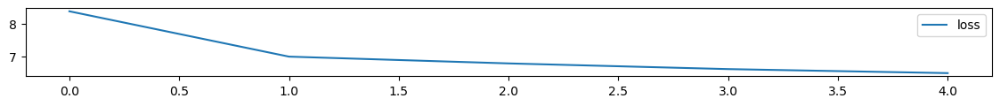

In [21]:
plt.figure(figsize=(14,1))
plt.plot(history.history['loss'], label='loss')
plt.legend()
plt.show()

In [22]:
 def generate_text(seed_text, next_words, model, max_sequence_len):
    for _ in range(next_words):
        token_list = tokenizer.texts_to_sequences([seed_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len-1, padding='pre')
        predicted = model.predict(token_list, verbose=0)
        
        output_word = ""
        for word,index in tokenizer.word_index.items():
            if index == predicted.all():
                output_word = word
                break
        seed_text += " "+output_word
    return seed_text.title()

In [23]:
print (generate_text("united states", 5, model, max_sequence_len))
print (generate_text("preident trump", 4, model, max_sequence_len))
print (generate_text("donald trump", 4, model, max_sequence_len))
print (generate_text("india and china", 4, model, max_sequence_len))
print (generate_text("new york", 4, model, max_sequence_len))
print (generate_text("science and technology", 5, model, max_sequence_len))

United States The The The The The
Preident Trump The The The The
Donald Trump The The The The
India And China The The The The
New York The The The The
Science And Technology The The The The The


In [24]:
joblib.dump(model, 'lstm_model.joblib')

['lstm_model.joblib']

# Transformers Bloom model

In [25]:
import torch
from transformers import AutoTokenizer, BloomForCausalLM

tokenizer = AutoTokenizer.from_pretrained("bigscience/bloom-560m")
model = BloomForCausalLM.from_pretrained("bigscience/bloom-560m")

inputs = tokenizer("Hello, my dog is cute", return_tensors="pt")
outputs = model(**inputs, labels=inputs["input_ids"])
loss = outputs.loss
logits = outputs.logits

In [26]:
prompt = "It was a dark and stormy night"
result_length = 50
inputs = tokenizer(prompt, return_tensors="pt")

print(tokenizer.decode(model.generate(inputs["input_ids"],
                       max_length=result_length, 
                       num_beams=2, 
                       no_repeat_ngram_size=2,
                       early_stopping=True
                      )[0]))

It was a dark and stormy night, and the wind was blowing in the
direction of the west. The sun was still shining, but it was not
very bright, for the clouds were thick and heavy. It was very dark
in


In [27]:
joblib.dump(model, 'bloom_model.joblib')

['bloom_model.joblib']